<a href="https://colab.research.google.com/github/dajley/Analyzing-Outliers/blob/main/EDA_on_Main_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [49]:
#Building ML Models with Main Dataset
#Research and Code by Dajanique Leysath

#**Installing Libraries**

In [50]:
#Install YData Profiling
#!pip install ydata-profiling

In [51]:
#Install YData SDK
#!pip install ydata-sdk

In [52]:
#Pandas is used for data manipulation and analysis
import pandas as pd
#For Profiling Report
#Import ProfileReport() class from ydata_profiling library
from ydata_profiling import ProfileReport

In [65]:
#For Normalization
#Import MinMaxScaler() class from sklearn.preprocessing library
from sklearn.preprocessing import MinMaxScaler

#For Standardization
#Import StandardScaler() class from sklearn.preprocessing library
from sklearn.preprocessing import StandardScaler

In [54]:
#Matplotlib is used for interactive plots
#Pyplot function make changes to figures
import matplotlib.pyplot as plt

#Seabron creates attractive and statistical graphics
import seaborn as sns

#**Dataset**

In [55]:
#Saves CSV file into dataframe
df_main = pd.read_csv("/content/drive/MyDrive/Datasets/df_main.csv")
df_main

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
0,104.9,60.9285,37.1985,49.0635,50.2490,50.8615,7.8580,23.1800,489.1580,0.1835,5.6170,1.3810,34.8855,46.0855
1,59.7,53.1395,31.8545,42.4970,47.2270,46.5050,9.8660,28.0395,447.4045,0.1910,5.8490,2.2715,30.7485,37.6335
2,43.0,60.1670,33.7200,46.9435,52.5145,51.8025,7.5750,23.9520,442.3180,0.2075,6.3380,2.1860,28.4045,44.6370
3,76.8,58.6490,32.1940,45.4220,52.1705,48.8195,8.3395,25.6365,488.8215,0.2055,6.2715,0.7400,30.5045,42.3990
4,94.9,57.2660,34.1885,45.7275,49.0000,47.4995,7.5190,23.1775,396.1995,0.1680,5.1335,2.2735,32.6630,42.4450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,117.1,62.7390,36.9900,49.8645,51.3840,42.9890,10.7280,26.8820,511.3620,0.2350,7.1915,0.9650,36.1970,47.0220
282,39.7,60.0255,35.2670,47.6465,48.9125,43.6705,8.9215,23.2990,427.6245,0.1820,5.5765,2.5450,36.7735,44.8625
283,65.1,62.0395,35.7990,48.9195,50.1140,47.6505,10.8985,21.7265,448.2195,0.2285,6.9955,0.7300,34.6885,44.7150
284,98.6,63.8520,40.2650,52.0590,52.7185,51.1560,10.7980,21.0045,418.0985,0.1990,6.0710,2.3815,40.1690,48.5900


#**Exploratory Data Analysis (EDA)**

##**Profile Report**

Pandas Profiling give a full report on the stats and visuals of the dataset

In [56]:
#Pass the dataframe to ProfileReport() class
profile = ProfileReport(df_main, title="Pandas Profiling Report", explorative=True)

In [57]:
#Display report
profile.to_notebook_iframe() #could also just use: profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 60.29it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [58]:
#Saves the report to an HTML file
profile.to_file("df_main_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

##**Correlations**

Pearson Correlation Coeffeicient

r = Covariance / Std Dev of X * Std Dev of Y

In [59]:
#Compute correlation matrix
corr_matrix = df_main.corr().abs()
corr_matrix

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
Value,1.000000,0.114121,0.017959,0.061331,0.228821,0.332270,0.027308,0.109507,0.150490,0.207645,0.206967,0.179414,0.136577,0.067075
Avg Max Temp,0.114121,1.000000,0.724030,0.949316,0.849990,0.684369,0.224368,0.247643,0.290263,0.738079,0.737178,0.135603,0.382225,0.957011
Avg Min Temp,0.017959,0.724030,1.000000,0.903980,0.606540,0.583659,0.111692,0.297559,0.096499,0.249618,0.249573,0.225344,0.791173,0.858445
Avg Temp,0.061331,0.949316,0.903980,1.000000,0.803402,0.690781,0.189896,0.287289,0.136503,0.571274,0.570678,0.018768,0.596849,0.984258
Avg Bare Soil Temp,0.228821,0.849990,0.606540,0.803402,1.000000,0.799243,0.279467,0.188760,0.319015,0.633735,0.632258,0.141759,0.301400,0.837696
Avg Turf Soil Temp,0.332270,0.684369,0.583659,0.690781,0.799243,1.000000,0.287460,0.211398,0.214323,0.486544,0.486589,0.068161,0.245580,0.721284
Avg Wind Speed,0.027308,0.224368,0.111692,0.189896,0.279467,0.287460,1.000000,0.647293,0.093411,0.079313,0.078896,0.215829,0.033135,0.317008
Avg Max Wind Speed,0.109507,0.247643,0.297559,0.287289,0.188760,0.211398,0.647293,1.000000,0.065805,0.141740,0.136886,0.051453,0.327432,0.332997
Total Solar Rad,0.150490,0.290263,0.096499,0.136503,0.319015,0.214323,0.093411,0.065805,1.000000,0.602456,0.609541,0.464572,0.285443,0.162490
Avg Penman PET,0.207645,0.738079,0.249618,0.571274,0.633735,0.486544,0.079313,0.141740,0.602456,1.000000,0.999686,0.314908,0.221080,0.579469


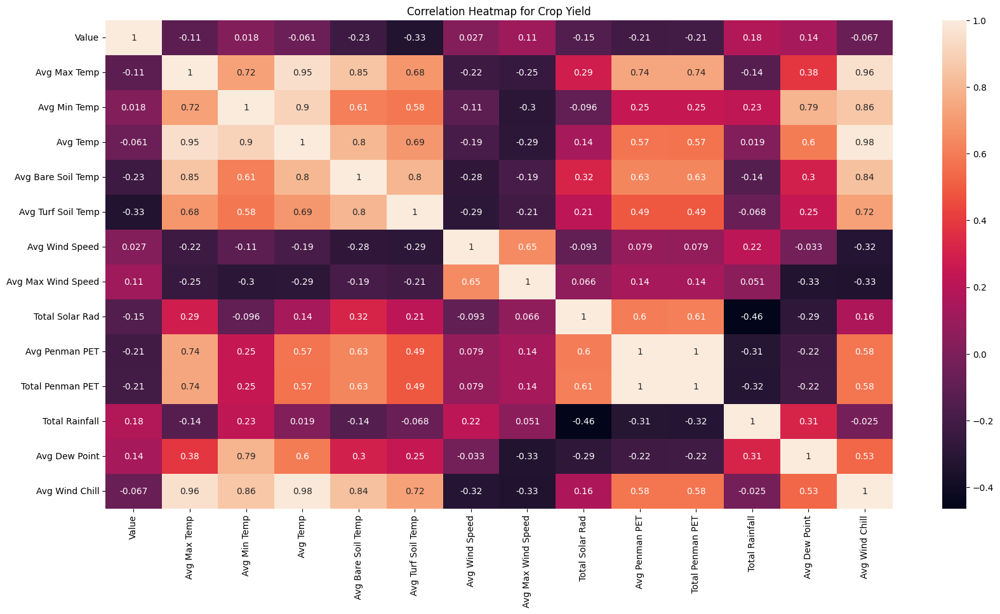

In [60]:
#Shows heatmap of correlation between features
sns.heatmap(df_main.corr(), annot=True)
plt.title("Correlation Heatmap for Crop Yield")

#Adjusts size of heatmap
plt.rcParams['figure.figsize'] = [20, 10]
plt.show()

#**Data Pre-Processing**

##**Feature Scaling: Normalization and Standardization**

**Feature Scaling** - transforms numeric features to be on a similar scale

**Normalization (Min-Max Method)**:

Values fall in between 0 and 1.

Xmin = 0 and Xmax = 1, values continue to fall in between.

Formula: Xnorm = (X - Xmin) / (Xmax - Xmin)

**Standardization (Z-Score Normalization Method)**:

Values are hcanged to have a mean of 0 and a standard deviation of 1.

**Best for normal distribution.

Formula: Z = (X - mean) / Std Dev




###**Normalization**

In [61]:
#Normalizes dataset

# Initialize and apply MinMaxScaler
minmax_scale = MinMaxScaler()
normalized_data = minmax_scale.fit_transform(df_main)

print(normalized_data)


[[0.46060255 0.60859208 0.60555428 ... 0.19801733 0.53038855 0.62989634]
 [0.19872538 0.1771044  0.19783322 ... 0.34638454 0.25886059 0.16879433]
 [0.10196987 0.56640722 0.34016175 ... 0.33213929 0.10501444 0.55087289]
 ...
 [0.23001159 0.67013822 0.49877928 ... 0.08955348 0.51745865 0.55512821]
 [0.42410197 0.77054538 0.83951324 ... 0.36471176 0.87716592 0.76653028]
 [0.34125145 0.93983879 0.79755093 ... 0.06522826 0.82393673 0.91268412]]


In [62]:
#Sets normalizaed data into dataframe
normalized_data = pd.DataFrame(normalized_data, columns=df_main.columns)
normalized_data

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
0,0.460603,0.608592,0.605554,0.604830,0.591854,0.754920,0.048971,0.272444,0.727369,0.409091,0.400876,0.198017,0.530389,0.629896
1,0.198725,0.177104,0.197833,0.132131,0.419469,0.527486,0.339039,0.548207,0.487114,0.477273,0.468613,0.346385,0.258861,0.168794
2,0.101970,0.566407,0.340162,0.452219,0.721086,0.804046,0.008090,0.316252,0.457845,0.627273,0.611387,0.332139,0.105014,0.550873
3,0.297798,0.482314,0.223735,0.342692,0.701463,0.648316,0.118527,0.411843,0.725433,0.609091,0.591971,0.091220,0.242846,0.428778
4,0.402665,0.405700,0.375906,0.364683,0.520607,0.579405,0.000000,0.272302,0.192473,0.268182,0.259708,0.346718,0.384517,0.431288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,0.531286,0.708888,0.589647,0.662491,0.656598,0.343931,0.463561,0.482522,0.855134,0.877273,0.860584,0.128707,0.616468,0.680987
282,0.082851,0.558569,0.458190,0.502825,0.515616,0.379509,0.202600,0.279196,0.373297,0.395455,0.389051,0.391953,0.654306,0.563175
283,0.230012,0.670138,0.498779,0.594464,0.584153,0.587288,0.488191,0.189961,0.491803,0.818182,0.803358,0.089553,0.517459,0.555128
284,0.424102,0.770545,0.839513,0.820466,0.732723,0.770295,0.473673,0.148990,0.318483,0.550000,0.533431,0.364712,0.877166,0.766530


In [63]:
'''
#Pass the dataframe to ProfileReport() class
normalized_profile = ProfileReport(normalized_data, title="Pandas Profiling Report of Normalized Dataset", explorative=True)

#Display report
normalized_profile.to_notebook_iframe()
'''

'\n#Pass the dataframe to ProfileReport() class\nnormalized_profile = ProfileReport(normalized_data, title="Pandas Profiling Report of Normalized Dataset", explorative=True)\n\n#Display report\nnormalized_profile.to_notebook_iframe() \n'

###**Standardization**

In [67]:
#Standardized dataset

# Initialize and apply StandardScaler
zscore_scale = StandardScaler()
standardized_data = zscore_scale.fit_transform(df_main)

print(standardized_data)


[[ 0.28550144  0.48547982  0.46244036 ... -0.47689364  0.15463644
   0.57806045]
 [-0.98109461 -1.58204931 -1.46806093 ...  0.36846361 -1.18380581
  -1.57842514]
 [-1.44906262  0.2833456  -0.79415559 ...  0.28729792 -1.94215936
   0.20848291]
 ...
 [-0.82977561  0.78038609 -0.04312412 ... -1.09489202  0.09090109
   0.22838422]
 [ 0.10896261  1.26150004  1.57020275 ...  0.4728873   1.86400545
   1.21707112]
 [-0.29175251  2.07269134  1.37151717 ... -1.23349074  1.60162289
   1.90060459]]


In [68]:
#Sets standardized data into dataframe
standardized_data = pd.DataFrame(normalized_data, columns=df_main.columns)
standardized_data

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
0,0.460603,0.608592,0.605554,0.604830,0.591854,0.754920,0.048971,0.272444,0.727369,0.409091,0.400876,0.198017,0.530389,0.629896
1,0.198725,0.177104,0.197833,0.132131,0.419469,0.527486,0.339039,0.548207,0.487114,0.477273,0.468613,0.346385,0.258861,0.168794
2,0.101970,0.566407,0.340162,0.452219,0.721086,0.804046,0.008090,0.316252,0.457845,0.627273,0.611387,0.332139,0.105014,0.550873
3,0.297798,0.482314,0.223735,0.342692,0.701463,0.648316,0.118527,0.411843,0.725433,0.609091,0.591971,0.091220,0.242846,0.428778
4,0.402665,0.405700,0.375906,0.364683,0.520607,0.579405,0.000000,0.272302,0.192473,0.268182,0.259708,0.346718,0.384517,0.431288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,0.531286,0.708888,0.589647,0.662491,0.656598,0.343931,0.463561,0.482522,0.855134,0.877273,0.860584,0.128707,0.616468,0.680987
282,0.082851,0.558569,0.458190,0.502825,0.515616,0.379509,0.202600,0.279196,0.373297,0.395455,0.389051,0.391953,0.654306,0.563175
283,0.230012,0.670138,0.498779,0.594464,0.584153,0.587288,0.488191,0.189961,0.491803,0.818182,0.803358,0.089553,0.517459,0.555128
284,0.424102,0.770545,0.839513,0.820466,0.732723,0.770295,0.473673,0.148990,0.318483,0.550000,0.533431,0.364712,0.877166,0.766530
